# **Saudia Arabia Used Car**
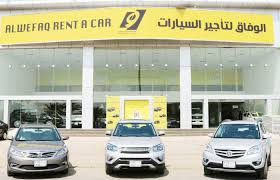


---

## Context : 
Arabia, as one of the largest oil producing countries in the world, makes fuel prices cheaper. This cheap fuel means that the use of vehicles, especially cars, in Saudi Arabia is also increasing. This high use of cars has certainly triggered increasingly massive market demand for cars, especially used cars. Based on www.mordorintelligence.com, the used car market in Saudi Arabia reached a value of USD 4.91 billion in 2021 and is projected to continue to increase in value to USD 8.69 billion in 2027. This can be seen from the CAGR (Compound Annual Growth) growth. Rate which continues to increase by 7.36% from the projected results.

The massive demand for used cars has encouraged business people to create online platforms for buying and selling used cars, for example syarah.com. That way, customers can of course choose the criteria for the car they want. The price determined must also be in accordance with the specifications of the cellphone. There are many used cars available with certain specifications, making determining the best car price a crucial factor that needs to be considered. Determining the best price is necessary so that the process of selling and buying used cars becomes easier. If the price is too high the car will be difficult to sell, conversely if the price is too low the profits will be smaller.

## Problem :
With the high demand for used cars in Saudi Arabia, determining used car prices is a challenge that needs to be overcome for syarah.com. Intense competition also makes determining accurate and competitive used car prices an important factor for carrying out overprice and underprice analysis in pricing used cars. With so many choices of cars with various specifications and conditions, it is hoped that the company will have a business model that can determine competitive car prices on the market so that many customers will be interested in buying cars from this company. Apart from that, customers also get the best experience in searching for the desired car according to specifications and price. This convenience and competitive prices can increase the number of customers and of course increase maximum income.

## Goals :
Based on the problem statement above, syarah.com must have tools that can **predict used car prices according to the criteria** and help customers find cars according to what they want. The criteria that need to be considered in determining the price of a used car, namely, car brand, car type, gear type, car origin, car year, mileage, and engine size are expected to **provide good accuracy in determining the car price**, which can provide competitive prices in the market that are affordable for customers but still profitable for the company. Not only that, with this machine learning tool, it is hoped that it will also be able to predict the best prices more efficiently and quickly so that the time and costs spent on research can be minimized.

## Analytic Approach : 
In this analytic approach, there needs to be a process of analyzing data to find patterns of existing features (criteria) that differentiate one car from another. Therefore, we will build a **regression** model which will help the company to be able to provide an accurate 'tool' for predicting the price of used cars that have just entered the syarah.com list, which will be useful for increasing the company's revenue.

## Metric Evaluation : 
The evaluation metrics that will be used are RMSE, MAE, and MAPE, where:

- RMSE is the mean square root value of the error,
- MAE is the average absolute value of the error,
- MAPE is the average percentage error produced by the regression model.

The smaller the RMSE, MAE, and MAPE values ​​produced, the more accurate the model is in predicting used car prices by considering the limitations of the features used. The two main metrics, namely RMSE and MAE, have significant differences. RMSE is more sensitive to large errors because it uses the square of the error, while MAE uses the absolute value of the error. In the context of used car price prediction, a major error can have a major financial impact, especially if the model predicts a price that is far from the actual value. Therefore, for this case, RMSE is more relevant because it pays special attention to major errors that can cause significant losses for model users, especially if used to determine the selling price of a used car. Thus, RMSE provides a more accurate picture of how well the model predicts used car prices.

## Data Undertanding : 
This dataset contains 5624 used car data taken from syarah.com. Here are some of the data features:

| Attribute    | Description                                | Data Type  |
|--------------|--------------------------------------------|------------|
| Type         | Type of used car.                          | object     |
| Region       | The region in which the used car was offered for sale. | object |
| Make         | The company name.                          | object     |
| Gear_Type    | Gear type size of used car.                | object     |
| Origin       | Origin of used car.                        | object     |
| Options      | Options of used car.                       | object     |
| Year         | Manufacturing year.                        | int64      |
| Engine_Size  | The engine size of used car.               | float64    |
| Mileage      | Mileage of used car.                       | int64      |
| Negotiable   | True if the price is 0, that means it is negotiable. | bool |
| Price        | Used car price.                            | int64      |


In [1]:
# Data manipulation 
import pandas as pd 
import numpy as np 

# Visualization
import matplotlib.pyplot as plt 
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Load Dataset

In [2]:
df = pd.read_csv('data_saudi_used_cars.csv')
df

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,True,0
1,Yukon,Riyadh,GMC,Automatic,Saudi,Full,2014,8.0,80000,False,120000
2,Range Rover,Riyadh,Land Rover,Automatic,Gulf Arabic,Full,2015,5.0,140000,False,260000
3,Optima,Hafar Al-Batin,Kia,Automatic,Saudi,Semi Full,2015,2.4,220000,False,42000
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,True,0
...,...,...,...,...,...,...,...,...,...,...,...
5619,X-Trail,Jeddah,Nissan,Automatic,Saudi,Standard,2018,2.5,78794,False,68000
5620,Altima,Jeddah,Nissan,Automatic,Saudi,Semi Full,2020,2.5,58000,True,0
5621,Yukon,Dammam,GMC,Automatic,Saudi,Full,2016,5.3,48000,False,145000
5622,RX,Dammam,Lexus,Automatic,Gulf Arabic,Full,2016,2.5,81000,False,154000


In [3]:
display(df.describe(), df.describe(include='O'))

,Year,Engine_Size,Mileage,Price
count,5624.000000,5624.000000,5.624000e+03,5624.000000
mean,2014.101885,3.295430,1.509234e+05,53074.058144
std,5.791606,1.515108,3.828360e+05,70155.340614
min,1963.000000,1.000000,1.000000e+02,0.000000
25%,2012.000000,2.000000,3.800000e+04,0.000000
50%,2016.000000,3.000000,1.030000e+05,36500.000000
75%,2018.000000,4.500000,1.960000e+05,72932.500000
max,2022.000000,9.000000,2.000000e+07,850000.000000


,Type,Region,Make,Gear_Type,Origin,Options
count,5624,5624,5624,5624,5624,5624
unique,347,27,58,2,4,3
top,Land Cruiser,Riyadh,Toyota,Automatic,Saudi,Full
freq,269,2272,1431,4875,4188,2233


## Data Preprocessing

At the data preprocessing stage, a cleaning will be carried out on the dataset and adjusted to future analysis needs. The following are several aspects that need to be looked at to carry out the cleaning process: 
1. Check whether there is duplicate data, missing values, and drop features that have no relevance to future modeling. 
2. After checking, the next step is the treatment process for missing values ​​by imputing (if any).

In [4]:
# Mengecek Missing Values pada data
df.isna().sum()

Type           0
Region         0
Make           0
Gear_Type      0
Origin         0
Options        0
Year           0
Engine_Size    0
Mileage        0
Negotiable     0
Price          0
dtype: int64

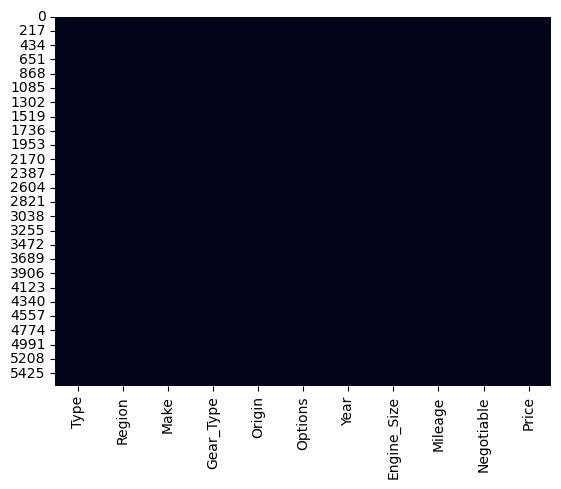

In [5]:
# Missing value heatmap
sns.heatmap(df.isnull(), cbar=False);

After checking, it turns out that there is no empty data in it, therefore no treatment will be carried out here.

In [6]:
# Check data apakah ada yang duplikat atau tidak 
print("Total baris duplicate:", df.duplicated().sum())

Total baris duplicate: 4


After checking the duplicate data, it turned out that there were 4 pieces of data that were indicated to be duplicates, therefore the treatment carried out was dropping duplicate columns.

In [7]:
# Drop data duplikat
df = df.drop_duplicates()

In [8]:
describe = pd.DataFrame(
    {
    'Features/Column': df.columns.values,
    'data_type': df.dtypes.values,
    'unique_value': df.nunique().values,
    'sample_unique': [df[col].unique() for col in df.columns]
    })
describe

,Features/Column,data_type,unique_value,sample_unique
0,Type,object,347,"[Corolla, Yukon, Range Rover, Optima, FJ, CX3,..."
1,Region,object,27,"[Abha, Riyadh, Hafar Al-Batin, Aseer, Makkah, ..."
2,Make,object,58,"[Toyota, GMC, Land Rover, Kia, Mazda, Porsche,..."
3,Gear_Type,object,2,"[Manual, Automatic]"
4,Origin,object,4,"[Saudi, Gulf Arabic, Other, Unknown]"
5,Options,object,3,"[Standard, Full, Semi Full]"
6,Year,int64,50,"[2013, 2014, 2015, 2020, 2019, 2012, 2016, 199..."
7,Engine_Size,float64,71,"[1.4, 8.0, 5.0, 2.4, 4.0, 2.0, 4.8, 3.5, 4.6, ..."
8,Mileage,int64,1716,"[421000, 80000, 140000, 220000, 49000, 25000, ..."
9,Negotiable,bool,2,"[True, False]"


In [9]:
df[df['Price']== 0]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,True,0
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,True,0
9,LS,Aseer,Lexus,Automatic,Saudi,Full,1998,4.6,300,True,0
14,Hilux,Yanbu,Toyota,Automatic,Saudi,Full,2014,2.7,209,True,0
15,Land Cruiser,Aseer,Toyota,Manual,Gulf Arabic,Semi Full,1982,4.6,340000,True,0
...,...,...,...,...,...,...,...,...,...,...,...
5610,Town Car,Jeddah,Lincoln,Automatic,Other,Full,1999,5.0,343,True,0
5614,Victoria,Makkah,Ford,Automatic,Saudi,Standard,2010,4.6,345000,True,0
5617,Yukon,Jubail,GMC,Automatic,Saudi,Semi Full,2006,5.3,300,True,0
5620,Altima,Jeddah,Nissan,Automatic,Saudi,Semi Full,2020,2.5,58000,True,0


### Dropping Features 

Let's now check the `Negotiable` column

In [10]:
display(df[df['Negotiable']== False], df[df['Negotiable']== True])

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
1,Yukon,Riyadh,GMC,Automatic,Saudi,Full,2014,8.0,80000,False,120000
2,Range Rover,Riyadh,Land Rover,Automatic,Gulf Arabic,Full,2015,5.0,140000,False,260000
3,Optima,Hafar Al-Batin,Kia,Automatic,Saudi,Semi Full,2015,2.4,220000,False,42000
5,CX3,Abha,Mazda,Automatic,Saudi,Semi Full,2019,2.0,25000,False,58000
6,Cayenne S,Riyadh,Porsche,Automatic,Saudi,Full,2012,4.8,189000,False,85000
...,...,...,...,...,...,...,...,...,...,...,...
5616,CX9,Qassim,Mazda,Automatic,Saudi,Full,2020,2.0,9500,False,132000
5618,Suburban,Riyadh,GMC,Automatic,Saudi,Full,2006,5.3,86000,False,50000
5619,X-Trail,Jeddah,Nissan,Automatic,Saudi,Standard,2018,2.5,78794,False,68000
5621,Yukon,Dammam,GMC,Automatic,Saudi,Full,2016,5.3,48000,False,145000


,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,True,0
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,True,0
9,LS,Aseer,Lexus,Automatic,Saudi,Full,1998,4.6,300,True,0
14,Hilux,Yanbu,Toyota,Automatic,Saudi,Full,2014,2.7,209,True,0
15,Land Cruiser,Aseer,Toyota,Manual,Gulf Arabic,Semi Full,1982,4.6,340000,True,0
...,...,...,...,...,...,...,...,...,...,...,...
5610,Town Car,Jeddah,Lincoln,Automatic,Other,Full,1999,5.0,343,True,0
5614,Victoria,Makkah,Ford,Automatic,Saudi,Standard,2010,4.6,345000,True,0
5617,Yukon,Jubail,GMC,Automatic,Saudi,Semi Full,2006,5.3,300,True,0
5620,Altima,Jeddah,Nissan,Automatic,Saudi,Semi Full,2020,2.5,58000,True,0


Based on the results of the data exploration above, it can be concluded that the `Negotiable` column influences the price column, where if the `Negotiable` column has the value `True` then `Price` becomes 0, from this it can be assumed that used cars whose prices can be negotiated are not included in the records.  Including these features in the model can provide too much information and result in overfitting. Overfitting occurs when a model becomes too complex and captures irrelevant patterns from previous training data, resulting in poor performance on data it has never seen before. Because the `Negotiable` feature/column is related to the negotiation process and may not have a significant impact on the actual price of the used car, we will remove the `Negotiable` feature.

In this way, the `Negotiable` column should be dropped with the assumption that it has no relevance to modeling purposes for predicting future prices. The `Negotiable` column only explains whether the price of the car can be negotiated or not.

In [11]:
df = df.drop(columns='Negotiable')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5620 entries, 0 to 5623
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Type         5620 non-null   object 
 1   Region       5620 non-null   object 
 2   Make         5620 non-null   object 
 3   Gear_Type    5620 non-null   object 
 4   Origin       5620 non-null   object 
 5   Options      5620 non-null   object 
 6   Year         5620 non-null   int64  
 7   Engine_Size  5620 non-null   float64
 8   Mileage      5620 non-null   int64  
 9   Price        5620 non-null   int64  
dtypes: float64(1), int64(3), object(6)
memory usage: 483.0+ KB


The `Negotiable` column has been dropped

### Checking Anomaly

In [13]:
df.describe()

,Year,Engine_Size,Mileage,Price
count,5620.000000,5620.000000,5.620000e+03,5620.000000
mean,2014.100356,3.296299,1.509222e+05,53086.404448
std,5.793003,1.515253,3.829633e+05,70175.153207
min,1963.000000,1.000000,1.000000e+02,0.000000
25%,2012.000000,2.000000,3.800000e+04,0.000000
50%,2016.000000,3.000000,1.030000e+05,36500.000000
75%,2018.000000,4.500000,1.960000e+05,73000.000000
max,2022.000000,9.000000,2.000000e+07,850000.000000


1. From the results of the description, the `price` column appears to have the smallest price of 0. From this it can be concluded that the price of 0 is unreasonable and a drop treatment will be carried out. It is hoped that dropping rows with a price of zero will be able to help in the modeling process later so that it does not interfere with the `Price` prediction model later. 

2. Next, in the `Mileage` column there is a data anomaly, namely that there is the highest value of **20,000,000** which is a very unreasonable result in terms of total kilometers (Extreme outlier) on a vehicle, based on https://www.dmv .virginia.gov/ The maximum odometer (mileage of a vehicle) is 999,999. So it can be assumed that if the car has a maximum of **20,000,000** then the column/feature drop treatment can be carried out.

In [14]:
df[df['Price'] == 0]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,0
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,0
9,LS,Aseer,Lexus,Automatic,Saudi,Full,1998,4.6,300,0
14,Hilux,Yanbu,Toyota,Automatic,Saudi,Full,2014,2.7,209,0
15,Land Cruiser,Aseer,Toyota,Manual,Gulf Arabic,Semi Full,1982,4.6,340000,0
...,...,...,...,...,...,...,...,...,...,...
5610,Town Car,Jeddah,Lincoln,Automatic,Other,Full,1999,5.0,343,0
5614,Victoria,Makkah,Ford,Automatic,Saudi,Standard,2010,4.6,345000,0
5617,Yukon,Jubail,GMC,Automatic,Saudi,Semi Full,2006,5.3,300,0
5620,Altima,Jeddah,Nissan,Automatic,Saudi,Semi Full,2020,2.5,58000,0


If you look at the table above, the `Price` feature has a value of 0 as many as 1796, so we will drop this column for the reasons explained previously.

The application of the drop in the `Price` column which has a value of 0 is also strengthened by the reason that when a used car in Arabia can be negotiated then the price is not displayed in this data set. So price = 0 is not a variation in the data but rather the absence of recorded prices for cars that can be negotiated. The implementation of this drop also helps price prediction models to be more accurate in determining prices, but has certain limitations in providing prices.

In [15]:
df = df[df['Price'] != 0]

In [16]:
df[df['Price'] == 0]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price


The `Price` feature/column has been cleared, then drop `Mileage`

In [17]:
df[df['Mileage'] > 999999]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
110,Optra,Riyadh,Chevrolet,Automatic,Saudi,Standard,2007,1.6,2000000,5000
333,Range Rover,Jeddah,Land Rover,Automatic,Saudi,Full,2009,2.4,2013000,35000
453,Azera,Riyadh,Hyundai,Automatic,Saudi,Semi Full,2018,3.5,1100000,80000
572,Camry,Yanbu,Toyota,Automatic,Other,Full,1998,2.5,4500000,15000
915,Pathfinder,Riyadh,Nissan,Automatic,Saudi,Standard,1998,3.5,3180003,10500
1334,Prado,Makkah,Toyota,Manual,Saudi,Semi Full,2006,4.0,2800000,35000
1412,Trailblazer,Jeddah,Chevrolet,Automatic,Other,Full,2004,5.3,3500000,10000
2115,Optima,Riyadh,Kia,Automatic,Saudi,Full,2014,2.5,2002500,42000
3292,Aveo,Makkah,Chevrolet,Automatic,Other,Semi Full,2014,1.6,1500000,11000
3387,Fusion,Hail,Ford,Automatic,Saudi,Full,2010,2.5,3000000,17000


There are 12 rows that have values ​​with `Mileage` of more than 999,999 Km

In [18]:
# Melakukan filtering data pada featrue Milegae
df = df[df['Mileage'] < 999999]

The implementation of filtering in the `Milegage` feature has been successfully handled. In this way, the initial assumption that Milegae exceeds the odometer is able to help in predicting prices more accurately based on this limitation of course.

In [19]:
df.describe()

,Year,Engine_Size,Mileage,Price
count,3808.000000,3808.000000,3808.000000,3808.000000
mean,2014.878939,3.181040,127662.132090,78223.501313
std,5.092297,1.459574,110751.635224,72808.892419
min,1963.000000,1.000000,100.000000,1.000000
25%,2013.000000,2.000000,48000.000000,35000.000000
50%,2016.000000,2.700000,102111.000000,58000.000000
75%,2018.000000,4.000000,181000.000000,95000.000000
max,2021.000000,9.000000,900000.000000,850000.000000


In [20]:
df[df['Price'] < 5000].sort_values(by= 'Price')

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
3131,Yukon,Jubail,GMC,Automatic,Saudi,Full,2019,5.3,50000,1
3992,G80,Riyadh,Genesis,Automatic,Other,Semi Full,2018,3.8,170000,500
4399,Yaris,Riyadh,Toyota,Automatic,Saudi,Standard,2018,1.5,100000,850
5128,Rio,Arar,Kia,Automatic,Saudi,Standard,2019,1.4,55500,884
3474,Yaris,Najran,Toyota,Automatic,Saudi,Standard,2019,1.6,85000,950
...,...,...,...,...,...,...,...,...,...,...
5009,Expedition,Al-Jouf,Ford,Automatic,Saudi,Full,2003,5.4,400000,4000
5121,Accent,Qassim,Hyundai,Manual,Saudi,Standard,2008,1.6,250000,4000
5521,Suburban,Al-Medina,Chevrolet,Automatic,Other,Semi Full,1997,6.0,292764,4000
4705,Caprice,Riyadh,Chevrolet,Automatic,Other,Full,1995,5.5,252,4500


After digging information from the website, which sells used cars at the lowest price in 2023 around 5,000 SAR, this price is the lowest average price for used cars in Saudi Arabia. I am here using sources from https://ksa.yallamotor.com/used-cars/pr_1000_2000, as one of the Saudi Arabia Used Car Market Leaders Source: https://www.mordorintelligence.com/industry-reports/saudi-arabia- used-car-market, and can be used as a reference in limiting the lowest price in this data set.

The data shows that there are 68 rows of used car prices that are still below 10,000, this is a data anomaly which also causes outliers. therefore we will drop the line.

In [21]:
df = df[df['Price'] >= 5000]

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3740 entries, 1 to 5622
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Type         3740 non-null   object 
 1   Region       3740 non-null   object 
 2   Make         3740 non-null   object 
 3   Gear_Type    3740 non-null   object 
 4   Origin       3740 non-null   object 
 5   Options      3740 non-null   object 
 6   Year         3740 non-null   int64  
 7   Engine_Size  3740 non-null   float64
 8   Mileage      3740 non-null   int64  
 9   Price        3740 non-null   int64  
dtypes: float64(1), int64(3), object(6)
memory usage: 321.4+ KB


The following are the final results after cleaning the data anomalies. The next step is to look at the data distribution and outliers using the IQR method for each numerical feature. When it is indicated that the data is not normally distributed or has quite high skewness, it is necessary to engineer each feature by reducing the skewness.


### Checking Outlier

The presence of outliers in the data certainly has an influence on the continuity of the analysis and the modeler that will be used later. At this stage I will check for outliers and consider appropriate treatment for the data later with domain knowledge as well.

Text(0.5, 1.0, 'Boxplot on Numeric Feature')

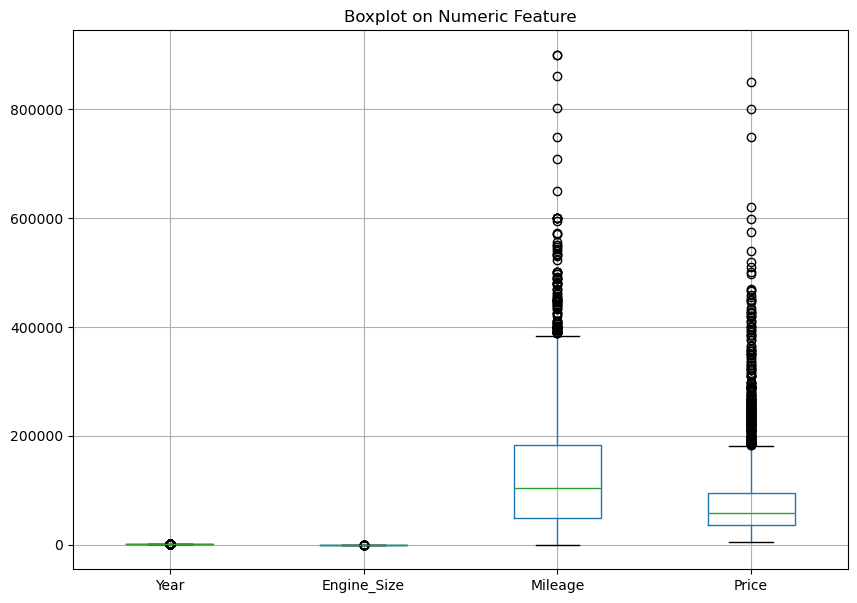

In [23]:
plt.figure(figsize=(10,7))
df.boxplot()
plt.title('Boxplot on Numeric Feature')

Note: 
* After identifying outliers in the numerical features above. The outliers here are only focused on the `Mileage` and `Price` columns. Why ? If you look closely at the outliers in the `year` and `engine_size` columns here no treatment is applied because these data are a type of data that provides a variety of information to assist in the modeling process in predicting prices. 

* Providing this treatment will of course also affect the resulting model, which is limited to being able to predict new listings whose values ​​are in the data range based on data sets that have gone through a cleaning process. Outside this data range, the prediction results from the model will be biased.

Now let's see how the scatter plot and regression plot of the `Mileage` and `Price` features look like.

Text(0.5, 1.0, 'Regression Plot Mileage dan Price')

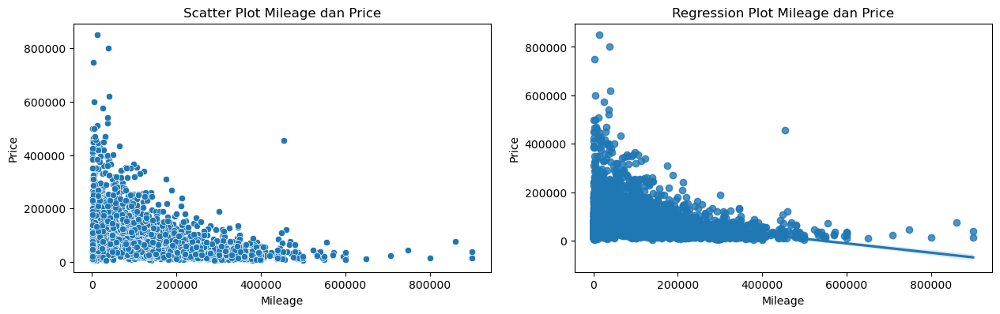

In [24]:
# Scatter plot antara Mileage dan Price
plt.figure(figsize=(15,9))
plt.subplot(2,2,1)
sns.scatterplot(data=df, x= 'Mileage', y="Price")
plt.title('Scatter Plot Mileage dan Price')

plt.subplot(2,2,2)
sns.regplot(data=df, x= 'Mileage', y="Price")
plt.title('Regression Plot Mileage dan Price')


Based on the results of the visual checks above, a conclusion can be drawn if the data that is indicated as an outlier will damage the regression line. That way I dropped outlier data using IQR.

In [25]:
# Function for checking outliers
def find_anomalies(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    limit = iqr*1.5
    print(f'IQR: {iqr}')

    limit_bawah = q1 - limit
    limit_atas = q3 + limit
    print(f'limit_bawah: {limit_bawah}')
    print(f'limit_atas: {limit_atas}')        

In [26]:
for col in df.describe().columns:
    print(f"Kolom: {col}")
    find_anomalies(df[col])
    print("----------------")

Kolom: Year
IQR: 5.0
limit_bawah: 2005.5
limit_atas: 2025.5
----------------
Kolom: Engine_Size
IQR: 2.0
limit_bawah: -1.0
limit_atas: 7.0
----------------
Kolom: Mileage
IQR: 134000.0
limit_bawah: -152000.0
limit_atas: 384000.0
----------------
Kolom: Price
IQR: 58500.0
limit_bawah: -51250.0
limit_atas: 182750.0
----------------


### Kolomn `Price`

In [27]:
df['Price'].describe()

count      3740.000000
mean      79613.078342
std       72728.051902
min        5000.000000
25%       36500.000000
50%       59000.000000
75%       95000.000000
max      850000.000000
Name: Price, dtype: float64

In [28]:
len(df[df['Price'] > 182750])

261

It can be seen that 92.97% of the data in the price column is worth less than 182,750 SAR, with a maximum value of 850,000. There is skewness in the distribution, namely the tail that extends to the right (positive skewness).

There are 261 or 7.03% of the total data whose price value is greater than 182,750 (upper limit according to the IQR method). Therefore, data that has a price value > 182,750 will not be included in the modeling, so the skewness will be reduced. This will of course be a limitation for the model that will be built later.

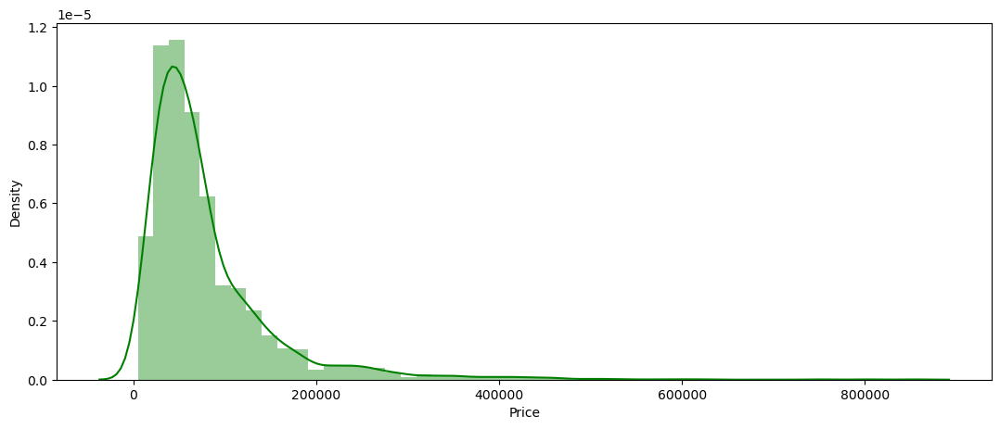

In [29]:
# Sebelum Filtering 
plt.figure(figsize=(13,5))
sns.distplot(df['Price'], color= 'green');

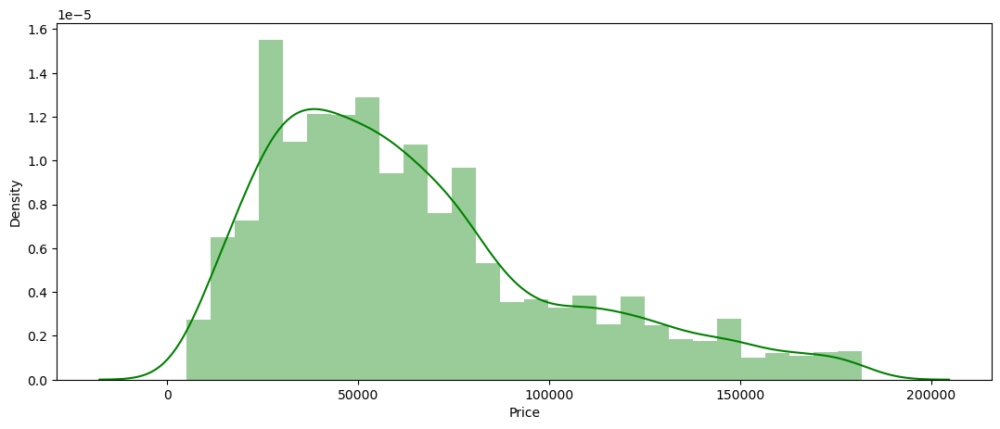

In [30]:
# Melakukan filtering pada data
df = df[(df['Price'] <= 182750)]

# After filtering
plt.figure(figsize=(13,5))
sns.distplot(df['Price'], color= 'green');

### Kolom `Mileage`


In [31]:
df['Mileage'].describe()

count      3479.00000
mean     134236.22449
std      112156.03370
min         100.00000
25%       55000.00000
50%      109191.00000
75%      190000.00000
max      900000.00000
Name: Mileage, dtype: float64

In [32]:
df.sort_values(by='Mileage', ascending=0, inplace=True)
df.head(7)

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
1957,Hilux,Jeddah,Toyota,Manual,Saudi,Full,1995,2.7,900000,14000
578,Copper,Qassim,MINI,Manual,Saudi,Full,1998,2.0,900000,40000
4606,Maxima,Riyadh,Nissan,Automatic,Saudi,Full,2017,1.0,860000,77000
2427,Corolla,Riyadh,Toyota,Manual,Saudi,Standard,2005,1.3,801500,14000
2493,Innova,Riyadh,Toyota,Automatic,Gulf Arabic,Standard,2015,2.7,749000,46000
4603,Land Cruiser,Tabouk,Toyota,Manual,Saudi,Full,1997,4.5,708000,25000
536,Datsun,Riyadh,Nissan,Manual,Other,Full,1998,2.4,650000,12000


Even though there are outliers in the `Mileage` column, if we look at the previous boxplot, we need to analyze further and consider domain knowledge to carry out treatment in this column. Mileage/Kilometers on the car will of course be related to other variables in the data (Mileage, Type, Make, GearType, and Options) because it is still possible to sell the car at that price. There is quite a large variation in values ​​below the year average in this data and the values ​​can still be accepted as a form of variation in later modeling.

Therefore, no treatment is carried out on this feature even though it has outliers. However, data that does not make sense in this feature has been cleaned in the previous process.

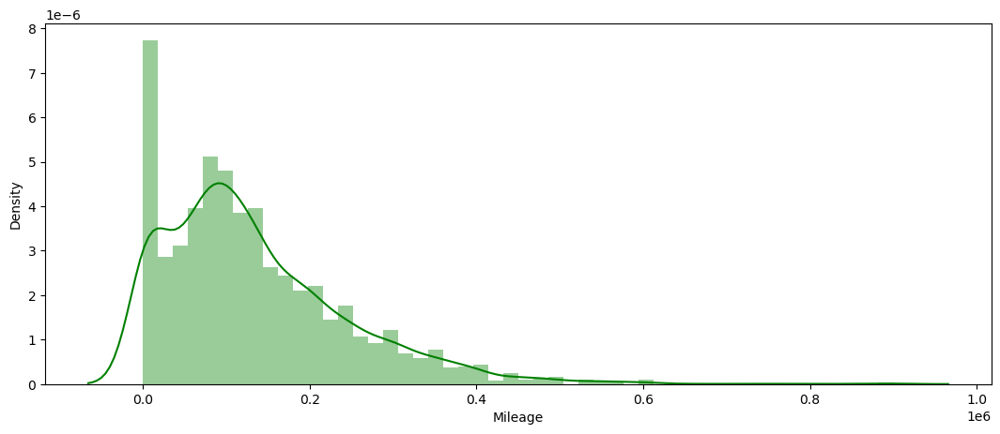

In [33]:
# Sebaran data pada kolom Mileage
plt.figure(figsize=(13,5))
sns.distplot(df['Mileage'], color= 'green');

This distribution shows that the data has skewness in its distribution, namely an elongated tail on the right (positive skewness), with most used cars having a mileage of approximately under 400,000 kilometers.

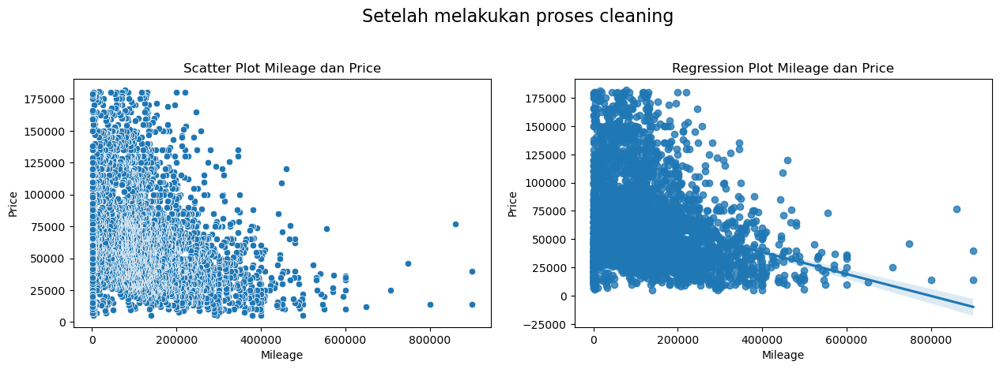

In [34]:
# Scatter plot antara Mileage dan Price
plt.figure(figsize=(15,9))
plt.subplot(2,2,1)
sns.scatterplot(data=df, x= 'Mileage', y="Price")
plt.title('Scatter Plot Mileage dan Price')

plt.subplot(2,2,2)
sns.regplot(data=df, x= 'Mileage', y="Price")
plt.title('Regression Plot Mileage dan Price')

plt.suptitle('Setelah melakukan proses cleaning', fontsize=16);

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3479 entries, 1957 to 5001
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Type         3479 non-null   object 
 1   Region       3479 non-null   object 
 2   Make         3479 non-null   object 
 3   Gear_Type    3479 non-null   object 
 4   Origin       3479 non-null   object 
 5   Options      3479 non-null   object 
 6   Year         3479 non-null   int64  
 7   Engine_Size  3479 non-null   float64
 8   Mileage      3479 non-null   int64  
 9   Price        3479 non-null   int64  
dtypes: float64(1), int64(3), object(6)
memory usage: 299.0+ KB


In the end, 3,479 rows of data remained from the previous 5,624 rows of data to be used for modeling. This means that 2,145 rows of data or 38.14% of the data have been eliminated in accordance with the assumptions and arguments presented in the previous processes.

### Checking Correlation 

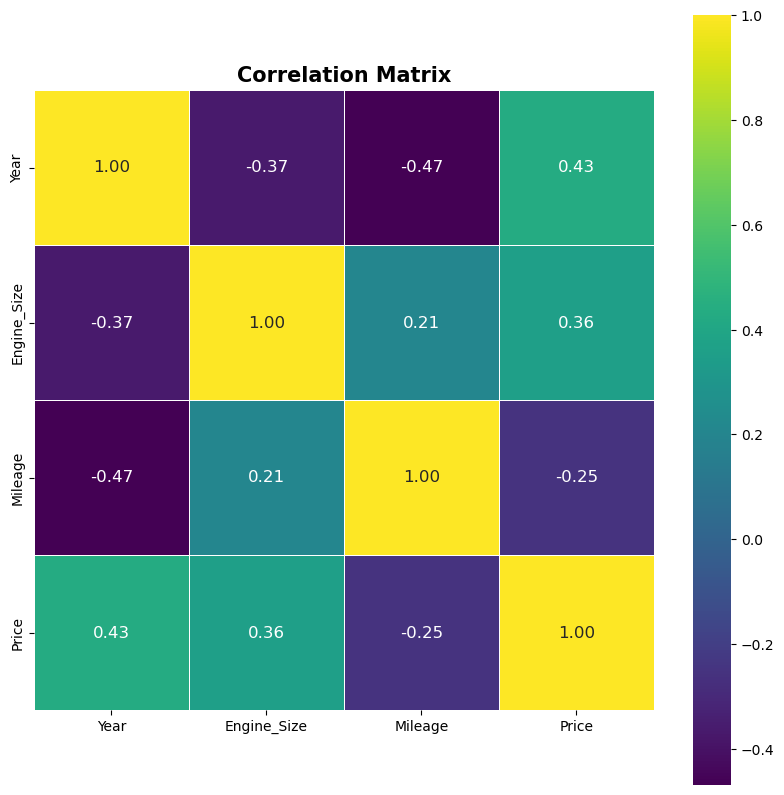

In [36]:
plt.figure(figsize=(10, 10))
palette = sns.diverging_palette(20, 220, n=256)
corr = df[['Year','Engine_Size','Mileage','Price']].corr(method='spearman') # Penggunaan Spearmen karena data tidak terdistribusi dengan normal
sns.heatmap(corr, annot=True, fmt='.2f', cmap="viridis", square=True, linewidths=.5,
            annot_kws={"fontsize": 12})  # Mengatur ukuran tulisan bobot
plt.title('Correlation Matrix', size=15, weight='bold')
plt.show()

Based on the correlation matrix provided, it can be concluded that there is a significant/strong relationship between the `Year` feature and the `Engine_Size` feature with the `Price` target. This relationship can be used to predict used car prices based on these characteristics.

Now let's look at **Muticolinearity**..

Multicollinearity is a condition where two or more independent variables in a multiple linear regression model have a very high correlation. This high correlation can cause problems in later regression models that will be created. In this context, we need to check whether there is a high correlation between other features in the dataset that may influence the interpretation of the model. 

Using the VIF (Variance Inflation Factor) method. VIF is a measure that shows how much the variance of the regression coefficient is influenced by other independent variables. If the VIF of an independent variable is high, then there is a high probability that there is multicollinearity.

In [37]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
    vif = pd.DataFrame()
    vif['variables'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

calc_vif(df[['Year','Engine_Size','Mileage','Price']])

,variables,VIF
0,Year,8.363965
1,Engine_Size,6.886905
2,Mileage,2.898615
3,Price,4.780769


based on www.statsmodels.org, VIF values ​​are calculated for each independent variable in the model. A VIF exceeding 5 is considered an indicator of high multicollinearity. This means that the independent variable has a strong correlation with other independent variables and can cause unstable and less accurate parameter estimates. we are expected to remove the feature from the model because it is likely that the feature has a high correlation with other features in the dataset.

However, all of this also depends on the context of the dataset. It is indeed best not to delete features that have a VIF value of more than 5, namely `Year` and `Engine_Size`, even though there are indications of multicollinearity. This is because this feature has a significant influence on determining the selling price of used cars.

In some cases, even though there is multicollinearity, the feature still has important informative value in predicting the target variable. In this context, `Year` and `Engine_Size` may provide important information about used car values ​​and consumer preferences based on engine size and the year the car was manufactured. Therefore, even if there is multicollinearity, we should retain these features in the model.

Note: 
* It should be emphasized that multicollinearity can also influence the interpretation results later. Therefore, when analyzing the model later, we need to be careful in interpreting the contribution of the independent variable to the dependent variable.

#### **After carrying out data preprocessing on the Feature with the numeric type, the next step is Data Exploration with the Category type..**

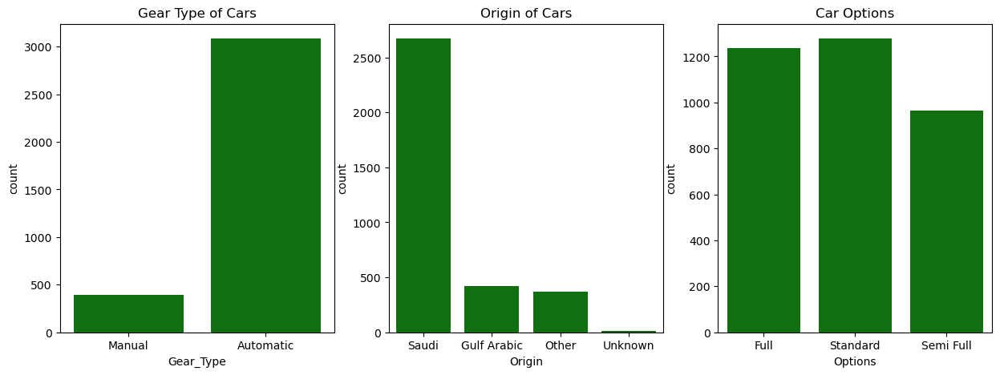

In [38]:
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
sns.countplot(x = df['Gear_Type'],color= 'green')
plt.title('Gear Type of Cars')

plt.subplot(1,3,2)
sns.countplot(x = df['Origin'],color= 'green')
plt.title('Origin of Cars')

plt.subplot(1,3,3)
sns.countplot(x = df['Options'],color= 'green')
plt.title('Car Options')

plt.show()

Insights: 
1. Based on **Gear_Type** used cars with **automatic** transmissions are the cars that are most often sold on the market, it is assumed that cars with automatic transmissions are easier to drive than manual ones.
2. If you look at **Origin**, the cars that sell best on the market are cars that come from **Saudi** compared to other regions.
3. Next is the **Options** column, where this column is a column that explains whether the car is the result of a modification or not. If you look at the total, cars with standard/unmodified modifications are the best-selling used cars on the Saudi Arabian market.

**Now let's see how each feature compares to the target**

''

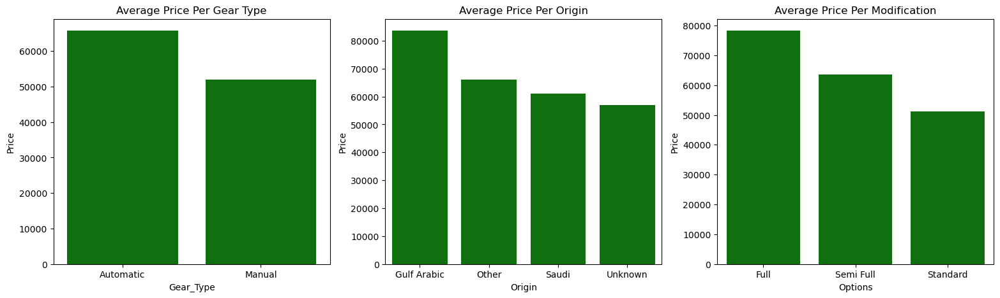

In [39]:
geartype_avgpr = df.groupby('Gear_Type')[['Price']].mean().sort_values(by = 'Price', ascending= False )
origin_avgpr = df.groupby('Origin')[['Price']].mean().sort_values(by = 'Price', ascending= False )
options_avgpr = df.groupby('Options')[['Price']].mean().sort_values(by = 'Price', ascending= False )

plt.figure(figsize=(19,5))

plt.subplot(1,3,1)
sns.barplot(geartype_avgpr['Price'],color= 'green')
plt.title('Average Price Per Gear Type')

plt.subplot(1,3,2)
sns.barplot(origin_avgpr['Price'],color= 'green')
plt.title('Average Price Per Origin')

plt.subplot(1,3,3)
sns.barplot(options_avgpr['Price'],color= 'green')
plt.title('Average Price Per Modification')
;

Insights: 
Based on the graph above, it can be identified
- The average price of a used car with an automatic transmission is higher than a used car with a manual transmission. 
- The average price of used cars from Gulf Arabic is higher than others.
- The average price of a used car with full modifications is higher than a used car with semi-full or standard modifications.

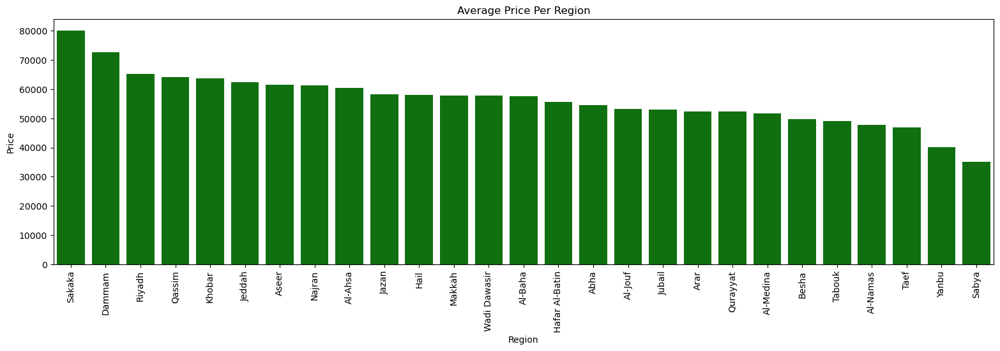

In [40]:
region_avgpr = df.groupby('Region')[['Price']].mean().sort_values(by = 'Price', ascending= False )

plt.figure(figsize=(19,5))
sns.barplot(region_avgpr['Price'],color= 'green')
plt.title('Average Price Per Region')
plt.xticks(rotation = 90);

Insights: 
- If you look closely, Sakaka and Damam are areas or regions that have an average car sales price above 70,000 SAR. It can be assumed that the cars in this area are used cars of good quality or luxury.

Now let's look at the types of car brands

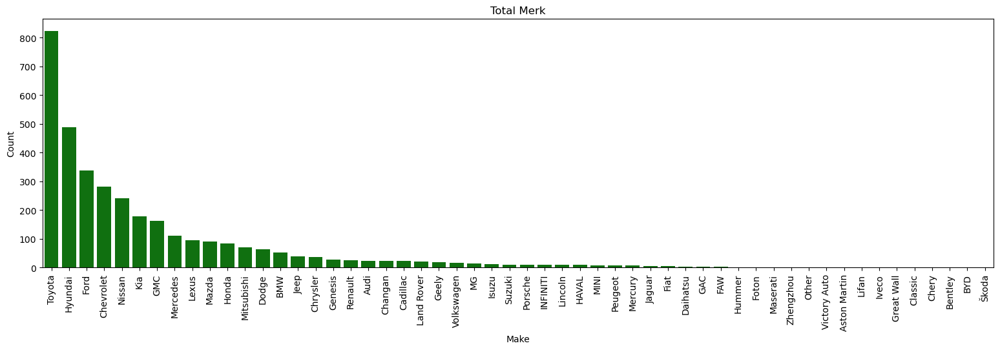

In [41]:
make_count = df.groupby('Make')[['Gear_Type']].count().sort_values(by= 'Gear_Type',ascending = False).reset_index()
make_count
plt.figure(figsize=(19,5))
sns.barplot(data = make_count , y ='Gear_Type', x = 'Make',color= 'green')
plt.ylabel('Count')
plt.title('Total Merk')
plt.xticks(rotation = 90);

Insights: 
* Toyota is the most frequently sold used car in Saudi Arabia, compared to others.

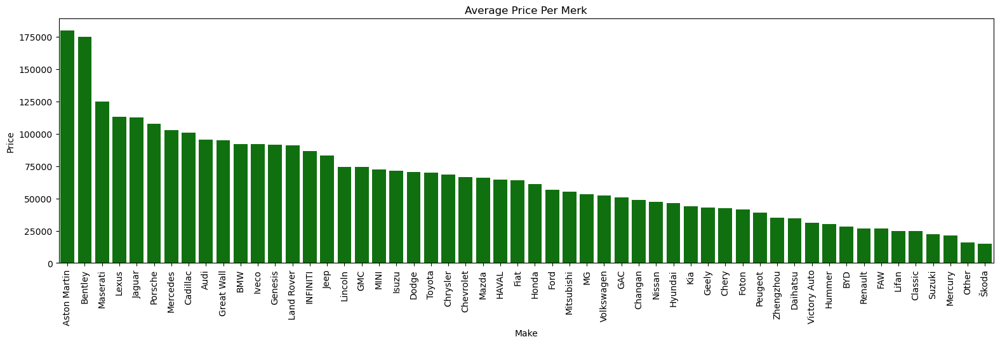

In [42]:
make_avrpr = df.groupby('Make')[['Price']].mean().sort_values(by= 'Price',ascending = False)

plt.figure(figsize=(19,5))
sns.barplot(make_avrpr['Price'],color= 'green')
plt.title('Average Price Per Merk')
plt.xticks(rotation = 90);

Insights: 
- If we look at the car brands, Aston Martin and Bentley are used cars with the highest average price of more than 165,000 SAR. The cars with the lowest average sales are from Suzuki to Skoda. This shows that sales of this car brand have their own segmentation for each brand. We know that Aston Martin is the least sold car, because Aston Martin is identified as a high class car (Prestige). Meanwhile, the Toyota with the highest sales only has an average car price that is in the middle ranking because the segment it reaches is wider. If you look at Toyota itself, it tends to promote the concept of a family car which is much in demand among middle class people who see cars as a necessity for traveling together. family rather than as a luxury item (its Prestige Value)

-------

#### Before entering Modeling we can conclude as a whole: 

Feature Numeric : <br>
- **`Year`**, **`Engine_Size`** and **`Mileage`** according to the results shown in the correlation matrix, the relationship between these three variables and the **`Price`** feature is obtained.

Feature Category: <br>
- **`Type`**, **`Region`**, **`Make`**, **`Gear_type`**, **`Origin`** and **`Options`** according to the results shown in the data exploration, it can be concluded that the difference in values ​​in each of these variables has an influence on the average price of used cars in Saudi Arabia. Therefore, these variables will be used for modeling but before that encoding will be carried out so that the data can be processed in modeling later.

By looking at the initial problem that has been identified, namely how to get the appropriate price for all existing features/variables in order to increase profits for the company, it can be concluded that in this process only **`Negotiable`** features are not relevant for use in the next stage , while for the remaining features a relationship can be identified between the variables and the **`Price`** feature. Therefore, variables that are related to the **`Price`** feature will be processed for use in a machine learning model to solve the problem of determining the price of a car in accordance with the specifications mentioned previously.

# **Modelling**

In [67]:
# Preprocessing 
from category_encoders import BinaryEncoder, OrdinalEncoder
from sklearn. preprocessing import OneHotEncoder, MinMaxScaler, RobustScaler, StandardScaler

from sklearn.experimental import enable_iterative_imputer
from sklearn.experimental import enable_halving_search_cv

from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, KFold, cross_val_score

# Tunning Paramaeter
from sklearn.model_selection import GridSearchCV

# Pipeline
from sklearn.pipeline import Pipeline

# Modelling
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor 
from sklearn.ensemble import RandomForestRegressor

# Model evaluation
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error


ModuleNotFoundError: No module named 'xgboost'

## Features and targeting
Separation between targets and features where **Feature** here contains 'Type', 'Region', 'Make', 'Gear_Type', 'Origin', 'Options', 'Year',
'Engine_Size', 'Mileage', and **Target** here are 'Price'

In [44]:

feature = df.drop( columns = 'Price')
target = df['Price']


## Splitting Data
Where to split data into train data and testing data
 * x_train = feature train -> used for training data in modeling
 * y_train = target train -> used for training data in modeling
 * x_test = feature testing -> used for testing data in modeling
 * y_test = target testing -> used for testing data in modeling

In [45]:
# Splitt x train dan x test 
x_train, x_test , y_train, y_test = train_test_split(feature, target, test_size= 0.2, random_state= 48)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(2783, 9)
(2783,)
(696, 9)
(696,)


Here the data is divided into a proportion of 80% for training and 20% for testing. The data sharing here is expected so that the model can learn to make predictions by training first, then continue to predict the testing data. The 80:20 ratio is a ratio that is commonly used to divide train and test data. This ratio is considered sufficient to provide good accuracy and does not consume too much time and resources.

## Encoding dan Scalling

Carrying out the transformer here, the first thing you need to pay attention to is the data type of each column in the dataset, because the cleaned dataset has several columns with categorical and numeric data types, so: 

- 'Gear_Type','Origin','Options' -> Encoding with OneHot, because the value of this feature is categorical data, Onehotencoder converts categorical data into numeric data by creating a new column for each category. The value in that column is 1 if the data falls into that category, and 0 if not.

- 'Type','Region','Make' -> Encode with Binary, because the value of this data is categorical data and has many categories, binary encoding is used to encode nominal variables that have too many categories. 

- 'Engine_Size', 'Mileage', 'Price' -> Scaling using a robust scaler, this scaling is used because clean data still contains some outliers.

In [46]:
# Membuat objek transformer 

transformer = ColumnTransformer(transformers =[
    ('OHEencoder', OneHotEncoder(drop= 'first'), ['Gear_Type','Origin','Options']),
    ('BinaryEncoder',BinaryEncoder(),['Type','Region','Make']),
    ('Scalling', RobustScaler(), feature.select_dtypes('number').columns)
],remainder= 'passthrough')

transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('OHEencoder', OneHotEncoder(drop='first'),
                                 ['Gear_Type', 'Origin', 'Options']),
                                ('BinaryEncoder', BinaryEncoder(),
                                 ['Type', 'Region', 'Make']),
                                ('Scalling', RobustScaler(),
                                 Index(['Year', 'Engine_Size', 'Mileage'], dtype='object'))])

### Model : Benchmark
In this benchmark model, we will compare the model performance results with RMSE, MAE and MAPE assessments. However, the use of evaluation metrics is focused on RMSE because it is based on the business context to obtain prediction accuracy for each model that will be tried later. 

* RMSE is a measurement method by measuring the difference in the value of a model's prediction as an estimate of the observed value. The accuracy of the measurement error estimation method is characterized by the presence of a small RMSE value. By obtaining RMSE with a small value, it is hoped that the model can predict car prices accurately with a very small error between the predicted value and the supposed value.

* MAE is the average absolute difference between the actual value and the predicted value. MAE shows the error value or the difference between the actual value and the predicted value. The smaller the MAE value, the better the model is at making predictions. By obtaining MAE with a small value, it is hoped that the model can predict car prices well with a very small absolute error value between the predicted value and the supposed value.

* MAPE is a percentage of the absolute error value / MAE. MAPE measures the absolute percentage error of MAE with the value of the data range. With MAPE the error value can be read more easily whether it is large or small, because the size of the error value depends on the data range. The smaller the error presentation value (percentage error) in MAPE, the more accurate the prediction results. By obtaining MAE with a small value, it is hoped that the model can predict car prices well with a very small absolute percentage error value between the predicted value and the supposed value.

There are 5 models that will be compared, namely:

1. Linear regression
2. KNN
3. Decision Trees
4. Random Forest
5. XGBoost

Of the five models, the 2 best models will be selected which provide small RMSE, MAE and MAPE values ​​and also small standard deviations of RMSE, MAE and MAPE. Apart from comparing the ML models that will be used, we will also compare the scaling methods that will be used which are able to provide the best performance in RMSE, MAE and MAPE. The scaling methods that will be compared are:

1. Standard Scaler
2. Min Max Scaler
3. Robust Scaler

In [47]:
# Algoritma ML yang digunakan
lr = LinearRegression()
knn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state=48)
rf = RandomForestRegressor(random_state=48)
xgb = XGBRegressor(random_state=48)

models = [lr, knn, dt, rf, xgb]

# # Scaling data
# S_scaler = StandardScaler()
# M_scaler = MinMaxScaler()
# R_scaler = RobustScaler()

In [48]:
# Funsi Model Cross Validation

score_rmse = []
nilai_mean_rmse = []
nilai_std_rmse = []

score_mae = []
nilai_mean_mae = []
nilai_std_mae = []

score_mape = []
nilai_mean_mape = []
nilai_std_mape = []

crossval = KFold(n_splits=5, shuffle=True, random_state=48)

for model in models:
    estimator = Pipeline([
        ('Preprocessing', transformer),
        ('model', model)
    ])

    # RMSE
    model_cv_rmse = cross_val_score(
        estimator,
        x_train,
        y_train,
        cv=crossval,
        scoring='neg_root_mean_squared_error',
        error_score='raise'
    )
    score_rmse.append(model_cv_rmse)
    nilai_mean_rmse.append(-model_cv_rmse.mean())  # Negate the values for RMSE
    nilai_std_rmse.append(model_cv_rmse.std())

    # MAE
    model_cv_mae = cross_val_score(
        estimator,
        x_train,
        y_train,
        cv=crossval,
        scoring='neg_mean_absolute_error',
        error_score='raise'
    )
    score_mae.append(model_cv_mae)
    nilai_mean_mae.append(-model_cv_mae.mean())  # Negate the values for MAE
    nilai_std_mae.append(model_cv_mae.std())

    # MAPE
    model_cv_mape = cross_val_score(
        estimator,
        x_train,
        y_train,
        cv=crossval,
        scoring='neg_mean_absolute_percentage_error',
        error_score='raise'
    )
    score_mape.append(model_cv_mape)
    nilai_mean_mape.append(-model_cv_mape.mean())  # Negate the values for MAPE
    nilai_std_mape.append(model_cv_mape.std())


In [49]:
# Create DataFrame
train_score = pd.DataFrame({
    'Model': ['Linear Regression', 'KNN Regressor', 'DecisionTree Regressor', 'RandomForest Regressor', 'XGBoost Regressor'],
    'Mean_RMSE': nilai_mean_rmse,
    'Std_RMSE': nilai_std_rmse,
    'Mean_MAE': nilai_mean_mae,
    'Std_MAE': nilai_std_mae,
    'Mean_MAPE': nilai_mean_mape,
    'Std_MAPE': nilai_std_mape
})

train_score

,Model,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
0,Linear Regression,27538.143811,559.784292,20362.687120,506.445174,0.452003,0.033582
1,KNN Regressor,21729.277516,945.365934,15001.302782,600.061711,0.333539,0.014408
2,DecisionTree Regressor,25571.154457,2539.114432,16203.256956,1262.152854,0.317614,0.019425
3,RandomForest Regressor,18649.406501,1322.394810,12339.830009,838.057992,0.258580,0.019826
4,XGBoost Regressor,17440.752014,1110.248084,11618.349051,709.056145,0.235018,0.019181


* If you use the Robust Scaler, it can be concluded that the XGBoost Regressor ranks first as a good model if we focus on RMSE, MAE, and MAPE, but is not more stable when viewed from its standard deviation than Linear Regression based on the standard deviation values ​​of RMSE, MAE, and, MAPE.

* The second highest is the RandomForest Regressor when looking at RMSE, MAE, and MAPE, but it is no more stable when looking at the standard deviation than Linear regression in terms of RMSE, MAE, and MAPE. 

Next, we will eliminate the 2 best models based on accuracy assessed from RMSE, MAE, and MAPE, namely **XGBoost Regressor** & **RandomForest Regressor**.

### **Determining the best model between Standard Scaler, MinMax Scaler, and Robust Scaler using Grid Search**

In [50]:
models = [rf, xgb] # 2 Model terbaik

estimator = Pipeline([
        ('preprocessing', transformer),
        ('model', None)
        ])

param_space = {
    'model' : models,
    'preprocessing__Scalling' : [MinMaxScaler(),RobustScaler(),StandardScaler()]
}

crossval = KFold(n_splits=5, shuffle=True, random_state=48)

# Hyperparameter tuning
gridsearch_scaler = GridSearchCV(
    estimator = estimator,
    param_grid = param_space,
    cv = crossval, 
    scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs = -1,
    refit = 'neg_root_mean_squared_error',
    return_train_score= True
)

Grid search is the simplest hyperparameter optimization technique that works by trying all combinations of predetermined hyperparameter values.

In modeling here the Gridsearch parameter is used to find which scaler has the best evaluation metric score. The parameters here are determined based on the 2 best models that have been determined previously and 3 selected scalers, namely Minmax, Standard, and Robust Scaler.

In [51]:
gridsearch_scaler.fit(x_train, y_train)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:28: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(cols):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/util

GridSearchCV(cv=KFold(n_splits=5, random_state=48, shuffle=True),
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('OHEencoder',
                                                                         OneHotEncoder(drop='first'),
                                                                         ['Gear_Type',
                                                                          'Origin',
                                                                          'Options']),
                                                                        ('BinaryEncoder',
                                                                         BinaryEncoder(),
                                                                         ['Type',
                                                                          'Region',
                                                                          'Make']),
                                                                        ('Scalling',
                                                                         RobustScaler(),
                                                                         Index(['Year', 'Engine_Size...
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=None, n_jobs=None,
                                                num_parallel_tree=None,
                                                random_state=48, ...)],
                         'preprocessing__Scalling': [MinMaxScaler(),
                                                     RobustScaler(),
                                                     StandardScaler()]},
             refit='neg_root_mean_squared_error', return_train_score=True,
             scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error',
                      'neg_mean_absolute_percentage_error'])

In [52]:
print('Best Params :',gridsearch_scaler.best_params_)
print('Best Score :',gridsearch_scaler.best_score_)

Best Params : {'model': XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=48, ...), 'preprocessing__Scalling': MinMaxScaler()}
Best Score : -17440.752013539844


In [53]:
result = pd.DataFrame(gridsearch_scaler.cv_results_)[['param_model','param_preprocessing__Scalling','rank_test_neg_root_mean_squared_error','mean_test_neg_root_mean_squared_error','std_test_neg_root_mean_squared_error',\
    'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error', 'mean_test_neg_mean_absolute_percentage_error',
       'std_test_neg_mean_absolute_percentage_error']].sort_values('rank_test_neg_root_mean_squared_error').head(15)
result

,param_model,param_preprocessing__Scalling,rank_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error
3,"XGBRegressor(base_score=None, booster=None, ca...",MinMaxScaler(),1,-17440.752014,1110.248084,-11618.349051,709.056145,-0.235018,0.019181
4,"XGBRegressor(base_score=None, booster=None, ca...",RobustScaler(),1,-17440.752014,1110.248084,-11618.349051,709.056145,-0.235018,0.019181
5,"XGBRegressor(base_score=None, booster=None, ca...",StandardScaler(),1,-17440.752014,1110.248084,-11618.349051,709.056145,-0.235018,0.019181
2,RandomForestRegressor(random_state=48),StandardScaler(),4,-18644.176271,1323.560937,-12337.613673,843.885280,-0.258482,0.019920
0,RandomForestRegressor(random_state=48),MinMaxScaler(),5,-18648.972970,1320.333362,-12343.555473,838.387388,-0.258501,0.019744
1,RandomForestRegressor(random_state=48),RobustScaler(),6,-18649.406501,1322.394810,-12339.830009,838.057992,-0.258580,0.019826


Conclusion :
 
Lower values ​​of Mean_RMSE, Mean_MAE, and Mean_MAPE indicate better model performance, while lower values ​​of Std_RMSE, Std_MAE, and Std_MAPE indicate better stability of model performance.
There is a significant difference between the RMSE and MAE values, where the RMSE value is higher because the residuals or error values ​​are squared first before being averaged. This causes RMSE to give a higher 'weight' to large error values. In other words, there are large error values ​​produced by all the algorithms used, so there is a significant difference between the RMSE and MAE values. The use of RMSE here is more frequent than MAE in cases where outliers are important to pay attention to. In the case of predicting used car prices, outliers can be cars that have very different specifications from other cars. 

* If we look at the experiments comparing the previous scaler methods between Standard, MinMax, and Robust Scaler, it can be concluded that the Min Max scaler method is able to provide the best average RMSE, MAE and MAPE values. It needs to be reviewed if we look at the standard deviation. in RMSE, MAE and MAPE, each of the three scalers shows that XGboost is a stable model.

* Based on RMSE, MAE and MAPE as well as MinMax, Robust, and Standard scaler methods, **XGBoost** is the **best** ML model even though feature engineering has been done by changing the scaling process. The next rank is occupied by Random Forest with Standard Scaler. Next, the **XGboost** model will continue to the `Price` prediction stage based on previously determined features.

### XGboost
XGBoost (eXtreme Gradient Boosting) is a machine learning algorithm that belongs to the ensemble algorithm family, specifically the gradient boosting algorithm. Gradient boosting is a technique that combines several weak models (weak learners), such as decision trees, to become a strong model (strong learner) in an iterative manner. XGBoost is a development of the Gradient Boosting Machine (GBM) algorithm with several additional features that are useful in speeding up the computing process and preventing overloading. XGBoosting Regressor is an implementation of XGBoost specifically designed for regression problems.

### Predict Before tuning using the selected model

In [54]:
# Model XGBoost
model = {'XGBRegressor Test': XGBRegressor(random_state=48)}

# Define model terhadap estimator terbaik
xgb_tuning = gridsearch_scaler.best_estimator_

# Fitting model
xgb_tuning.fit(x_train, y_train)

# Predict test set
y_pred_xgb_beforetune = xgb_tuning.predict(x_test)

# Simpan nilai metrics RMSE, MAE & MAPE setelah tuning
rmse_xgb_tuning = np.sqrt(mean_squared_error(y_test, y_pred_xgb_beforetune))
mae_xgb_tuning = mean_absolute_error(y_test, y_pred_xgb_beforetune)
mape_xgb_tuning = mean_absolute_percentage_error(y_test, y_pred_xgb_beforetune)

score_before_tuning = pd.DataFrame({'RMSE': rmse_xgb_tuning, 'MAE': mae_xgb_tuning, 'MAPE': mape_xgb_tuning}, index=model.keys())
score_before_tuning

,RMSE,MAE,MAPE
XGBRegressor Test,15865.530871,10829.690434,0.231909


Based on the results above, it can be seen that the best prediction is before tuning the XGboost model to predict `Price` if seen from the RMSE, MAE, and MAPE. Therefore, the conclusion that can be drawn here is that **XGboost** is a model that will be tuned later to improve its performance in predicting used car prices according to the business context that has been determined.

## Hyper Parameter Tuning XGboost

Tuning the model here is expected to improve the performance of the model we have determined earlier, namely XGBoost.<br>
Determining tuning parameters for XGboost, what do you need to pay attention to?



> **1. Learning rate** : <br> determines how much change is made to the model in each iteration. A learning rate value that is too high can cause the model to overfit, while a learning rate value that is too low can cause the model to underfit. The commonly used learning rate value is 0.01 to 0.1. A lower learning rate value will cause the model to be more stable, but will take longer to achieve optimal accuracy.

> **2. n_estimators** : <br>
determines the number of trees built by the model. An n_estimators value that is too small can cause the model to be less accurate, while an n_estimators value that is too large can cause the model to overfit. Commonly used n_estimators values ​​are 100 to 1000. Higher n_estimators values ​​will increase prediction accuracy, but will also increase the risk of overfitting.

>**3. max_depth**: <br> determines the maximum depth of each tree. A max_depth value that is too high can cause the model to overfit, while a max_depth value that is too low can cause the model to be less accurate. Commonly used max_depth values ​​are 3 to 10. Higher max_depth values ​​will increase prediction accuracy, but will also increase the risk of overfitting.

>**4. min_child_weight** :<br> specifies the minimum amount of data that should be present in each leaf of the tree. A min_child_weight value that is too high can cause model underfitting, while a min_child_weight value that is too low can cause model overfitting. Commonly used min_child_weight values ​​are 1 to 5. Higher min_child_weight values ​​will make the model more stable, but will also reduce prediction accuracy.

>**5. gamma** :<br> determines how much influence a feature has on the decisions taken by the model. A gamma value that is too high can cause the model to underfit, while a gamma value that is too low can cause the model to overfit. Commonly used gamma values ​​are 0.01 to 0.2. A higher gamma value will make the model more sensitive to features, but will also increase the risk of overfitting.

>**6. subsample** :<br> determines the percentage of data used to build each tree. A subsample value that is too low can cause the model to underfit, while a subsample value that is too high can cause the model to overfit. Commonly used subsample values ​​are 0.8 to 1. Higher subsample values ​​will make the model more efficient, but will also reduce prediction accuracy.

>**7. colsample_bytree** :<br> determines the percentage of features used to build each tree. A colsample_bytree value that is too low can cause model underfitting, while a colsample_bytree value that is too high can cause model overfitting. Commonly used colsample_bytree values ​​are 0.8 to 1. Higher colsample_bytree values ​​will make the model more efficient, but will also reduce prediction accuracy.

Source : 
- Chen, Tianqi, and Carlos Guestrin. "Xgboost: A scalable tree boosting system." *Proceedings of the 22nd acm sigkdd international conference on knowledge discovery and data mining.* 2016. 
- https://xgboost.readthedocs.io/en/stable/parameter.html

In [55]:
estimator = Pipeline([
        ('preprocessing', transformer),
        ('model', None)
        ])

param_space_xgb = {
    'model' : [XGBRegressor(random_state = 48)], 
    'model__learning_rate': [0.01,0.1], # memberi perubahan pada leraning rate 
    'model__n_estimators' : [100],
    'model__max_depth': [5,6,7], #memberi perubahan pada max depth
    'model__min_child_weight': [1,3,5], 
    'model__gamma' : [0.01,0.2],
    'model__subsample' : [0.8,1],
    'model__colsample_bytree': [0.8,1],
    'preprocessing__Scalling' : [MinMaxScaler(),RobustScaler(),StandardScaler()]
}

crossval = KFold(n_splits=5, shuffle=True, random_state=48)

# Hyperparameter tuning
best_xgb = GridSearchCV(
    estimator = estimator,
    param_grid = param_space_xgb,
    cv = crossval, 
    scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs = -1,
    refit = 'neg_root_mean_squared_error',
    return_train_score= True
)

In [56]:
best_xgb.fit(x_train,y_train)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:28: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(cols):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/util

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:28: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(cols):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/utils.py:50: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return pd.api.types.is_categorical_dtype(dtype)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/category_encoders/util

GridSearchCV(cv=KFold(n_splits=5, random_state=48, shuffle=True),
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('OHEencoder',
                                                                         OneHotEncoder(drop='first'),
                                                                         ['Gear_Type',
                                                                          'Origin',
                                                                          'Options']),
                                                                        ('BinaryEncoder',
                                                                         BinaryEncoder(),
                                                                         ['Type',
                                                                          'Region',
                                                                          'Make']),
                                                                        ('Scalling',
                                                                         RobustScaler(),
                                                                         Index(['Year', 'Engine_Size...
                         'model__max_depth': [5, 6, 7],
                         'model__min_child_weight': [1, 3, 5],
                         'model__n_estimators': [100],
                         'model__subsample': [0.8, 1],
                         'preprocessing__Scalling': [MinMaxScaler(),
                                                     RobustScaler(),
                                                     StandardScaler()]},
             refit='neg_root_mean_squared_error', return_train_score=True,
             scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error',
                      'neg_mean_absolute_percentage_error'])

In [57]:
print('Best Params:',best_xgb.best_params_)
print("")
print('Best score:', best_xgb.best_score_)

Best Params: {'model': XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=48, ...), 'model__colsample_bytree': 0.8, 'model__gamma': 0.01, 'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__min_child_weight': 3, 'model__n_estimators': 100, 'model__subsample': 0.8, 'preprocessing__Scalling': MinMaxScaler()}

In [58]:
pd.DataFrame(best_xgb.cv_results_)[['param_model','param_preprocessing__Scalling','rank_test_neg_root_mean_squared_error','mean_test_neg_root_mean_squared_error','std_test_neg_root_mean_squared_error',\
    'mean_test_neg_mean_absolute_error', 'std_test_neg_mean_absolute_error', 'mean_test_neg_mean_absolute_percentage_error',
       'std_test_neg_mean_absolute_percentage_error']].sort_values('rank_test_neg_root_mean_squared_error').head(1)

,param_model,param_preprocessing__Scalling,rank_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,mean_test_neg_mean_absolute_error,std_test_neg_mean_absolute_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error
206,"XGBRegressor(base_score=None, booster=None, ca...",StandardScaler(),1,-16807.743542,983.014281,-11154.982629,544.444418,-0.230175,0.016285


From the results of conducting several experiments, it can be concluded that the best parameters after tuning the XGboost model with Gridsearch are as follows: 

1. colsample_bytree : 0.8
2. gamma: 0.01 
3. learning_rate : 0.1 
4. max_depth : 7
5. min_child_weight : 3 
6. n_estimators : 100 
7. subsample: 0.8

The best score for the XGBoost model tuning here is `-16807.743541547272` in terms of RMSE<br>

Note:
It needs to be emphasized that the results of this tuning are based on considerations of the arguments previously explained. So this will of course be a limitation in model formation and also regarding the accuracy and stability of the model used.

### Predict After Tuning XGBoost

In [59]:
# Model XGBoost
model = {'XGBRegressor': XGBRegressor(random_state=48)}

# Define model terhadap estimator terbaik
xgb_tuning = best_xgb.best_estimator_

# Fitting model
xgb_tuning.fit(x_train, y_train)

# Predict test set
y_pred_xgb_tuning = xgb_tuning.predict(x_test)

# Simpan nilai metrics RMSE, MAE & MAPE setelah tuning
rmse_xgb_tuning = np.sqrt(mean_squared_error(y_test, y_pred_xgb_tuning))
mae_xgb_tuning = mean_absolute_error(y_test, y_pred_xgb_tuning)
mape_xgb_tuning = mean_absolute_percentage_error(y_test, y_pred_xgb_tuning)

score_after_tuning = pd.DataFrame({'RMSE': rmse_xgb_tuning, 'MAE': mae_xgb_tuning, 'MAPE': mape_xgb_tuning}, index=model.keys())
score_after_tuning

,RMSE,MAE,MAPE
XGBRegressor,15778.439722,10573.817809,0.221048


### Performance Comparison

This section shows the performance of the model when making predictions before tuning and after tuning

In [60]:
display(score_before_tuning.rename(index= {'XGBRegressor Test' : 'XGBRegressor_Before_Tuned'}), score_after_tuning.rename(index= {'XGBRegressor' : 'XGBRegressor_After_Tuned'}))

,RMSE,MAE,MAPE
XGBRegressor_Before_Tuned,15865.530871,10829.690434,0.231909


,RMSE,MAE,MAPE
XGBRegressor_After_Tuned,15778.439722,10573.817809,0.221048


The model experienced an increase in performance (RMSE, MAE & MAPE values ​​decreased) by doing hyperparameter tuning, although it was not that significant.

* RMSE, MAE & MAPE before tuning: 15865.53, 10829.69, 0.231
* RMSE, MAE & MAPE after tuning: 15778.43, 10573.81, 0.221

Now we see how the scatter plot shows actual and predicted used car prices using the XGboost model

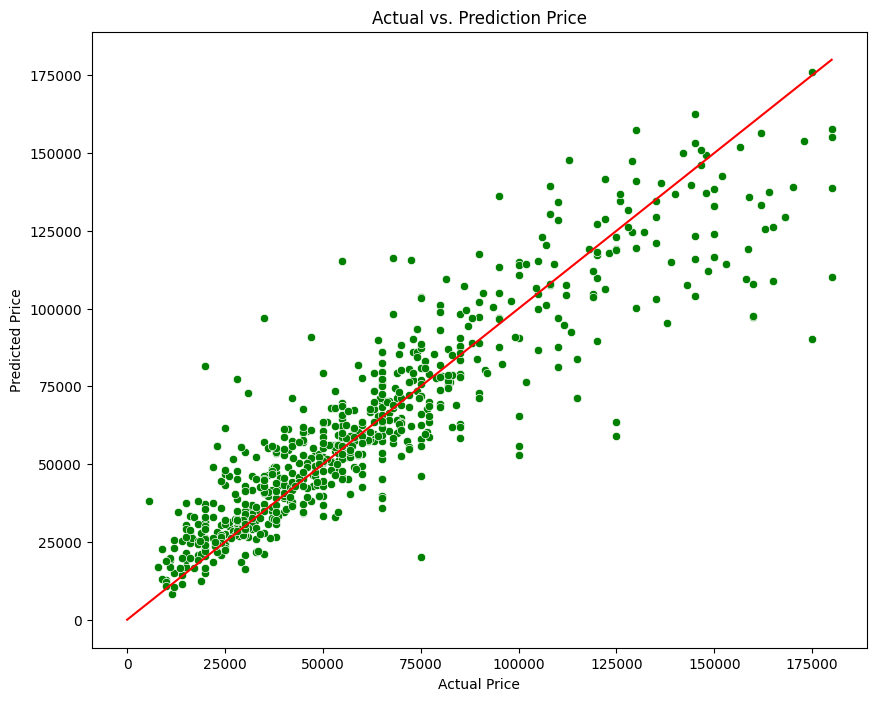

In [61]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x=y_test, y=y_pred_xgb_tuning, color = 'green').set(title='Actual vs. Prediction Price', 
                                                   xlabel='Actual Price', 
                                                   ylabel='Predicted Price')
sns.lineplot(x=list(np.arange(0,180000)), y=list(np.arange(0,180000)), color='red')
plt.show()

In [62]:
residual = pd.DataFrame({'Actual' : y_test,
              'Prediction Price' :y_pred_xgb_tuning})
residual['Residual'] = residual['Prediction Price'] - residual['Actual']

residual['type_est'] = np.where(residual['Residual']< 0, 'Underprice', 'Oveprice')
residual

,Actual,Prediction Price,Residual,type_est
4809,45000,34232.386719,-10767.613281,Underprice
4734,62000,66719.500000,4719.500000,Oveprice
4804,80000,69259.750000,-10740.250000,Underprice
1551,79000,77718.859375,-1281.140625,Underprice
1615,45000,34572.273438,-10427.726562,Underprice
...,...,...,...,...
954,30000,37178.378906,7178.378906,Oveprice
5551,76000,59855.062500,-16144.937500,Underprice
2929,152000,142567.093750,-9432.906250,Underprice
21,76000,80787.187500,4787.187500,Oveprice


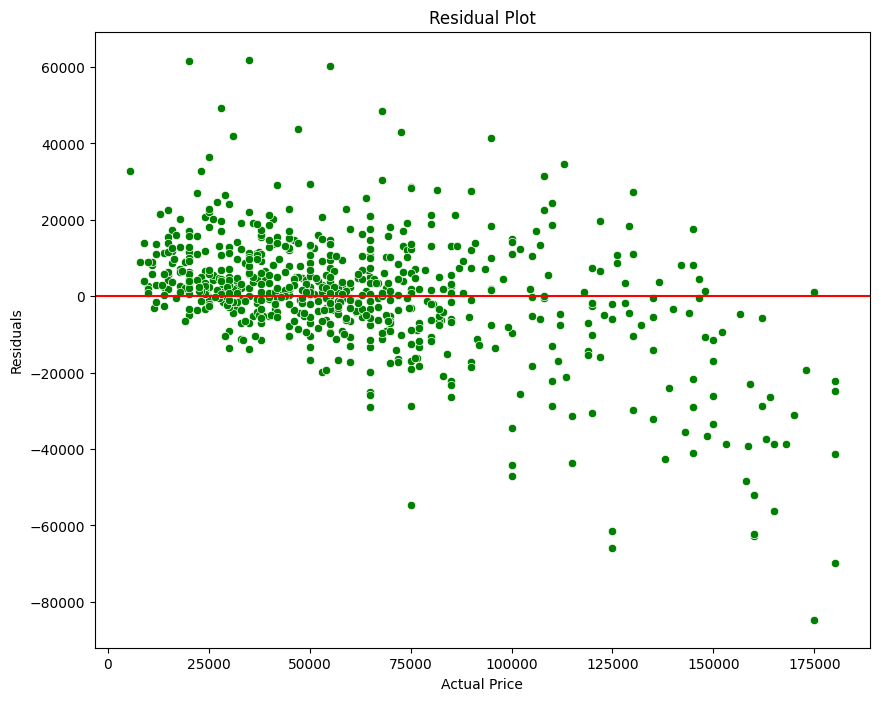

In [63]:
plt.figure(figsize=(10, 8))
residuals = y_pred_xgb_tuning - y_test 
plot = sns.scatterplot(x=y_test, y=residuals, color = 'green').set(title='Residual Plot', 
                                                 xlabel='Actual Price', 
                                                 ylabel='Residuals')
plt.axhline(y=0, color='red')


In [64]:
print(f"Harga yang diprediksi lebih dari nilai aktual (Harga Overprice): {len(residual[residual['Residual'] > 0])}")
print(f"Harga yang diprediksi kurang dari nilai aktual (Harga Underprice) : {len(residual[residual['Residual'] < 0])}")
print(f"Prediksi Overprice tertinggi adalah : {residual[residual['Residual'] > 0]['Residual'].max()}")
print(f"Prediksi Underprice terendah adalah : {residual[residual['Residual'] < 0]['Residual'].min()}")

Harga yang diprediksi lebih dari nilai aktual (Harga Overprice): 393
Harga yang diprediksi kurang dari nilai aktual (Harga Underprice) : 303
Prediksi Overprice tertinggi adalah : 61930.1953125
Prediksi Underprice terendah adalah : -84696.140625


In this case, it shows that the XGBRegressor model used predicts prices to be more expensive than actual by 393 data (Overprice), and predicts prices to be cheaper than actual by 303 data (Underprice).

- It can be concluded that the used car price prediction model here has quite good accuracy. This is indicated by the number of accurate price predictions (reasonable overprice or underprice) which is greater than the number of inaccurate price predictions.

- However, there are still several cases of overpricing and underpricing that do not make sense and need to be analyzed further. Based on the residual plot results above, it can be seen that overpriced used car prices tend to occur at low actual used car prices. 

- Meanwhile, underpriced used car prices tend to occur when actual used car prices are high. This may be caused by several factors


## Feature Importance

The `feature_importances_` function is used to determine the level of importance of each feature in influencing the target variable (in this case, the "price" variable). Features that have a higher contribution in predicting the target will have a higher score.

By using the feature_importances_ function, we can see the ranking of features based on their level of importance. Features with a high score indicate that the feature has a significant influence on the target, while features with a low score have a smaller influence.

In [65]:
xgb_tuning['model'].feature_importances_

array([0.01458028, 0.02439408, 0.04265375, 0.00113377, 0.02741712,
       0.07537541, 0.01558255, 0.02128946, 0.03514484, 0.02467402,
       0.0182942 , 0.02796615, 0.03020377, 0.02443638, 0.01927388,
       0.00727754, 0.01404578, 0.01306775, 0.01124102, 0.01177963,
       0.025317  , 0.04968725, 0.0410462 , 0.07815906, 0.04442574,
       0.02936252, 0.12539326, 0.12071472, 0.02606295], dtype=float32)

In [66]:
best_xgb.best_estimator_.named_steps['preprocessing'].get_feature_names_out()

array(['OHEencoder__Gear_Type_Manual', 'OHEencoder__Origin_Other',
       'OHEencoder__Origin_Saudi', 'OHEencoder__Origin_Unknown',
       'OHEencoder__Options_Semi Full', 'OHEencoder__Options_Standard',
       'BinaryEncoder__Type_0', 'BinaryEncoder__Type_1',
       'BinaryEncoder__Type_2', 'BinaryEncoder__Type_3',
       'BinaryEncoder__Type_4', 'BinaryEncoder__Type_5',
       'BinaryEncoder__Type_6', 'BinaryEncoder__Type_7',
       'BinaryEncoder__Type_8', 'BinaryEncoder__Region_0',
       'BinaryEncoder__Region_1', 'BinaryEncoder__Region_2',
       'BinaryEncoder__Region_3', 'BinaryEncoder__Region_4',
       'BinaryEncoder__Make_0', 'BinaryEncoder__Make_1',
       'BinaryEncoder__Make_2', 'BinaryEncoder__Make_3',
       'BinaryEncoder__Make_4', 'BinaryEncoder__Make_5', 'Scalling__Year',
       'Scalling__Engine_Size', 'Scalling__Mileage'], dtype=object)

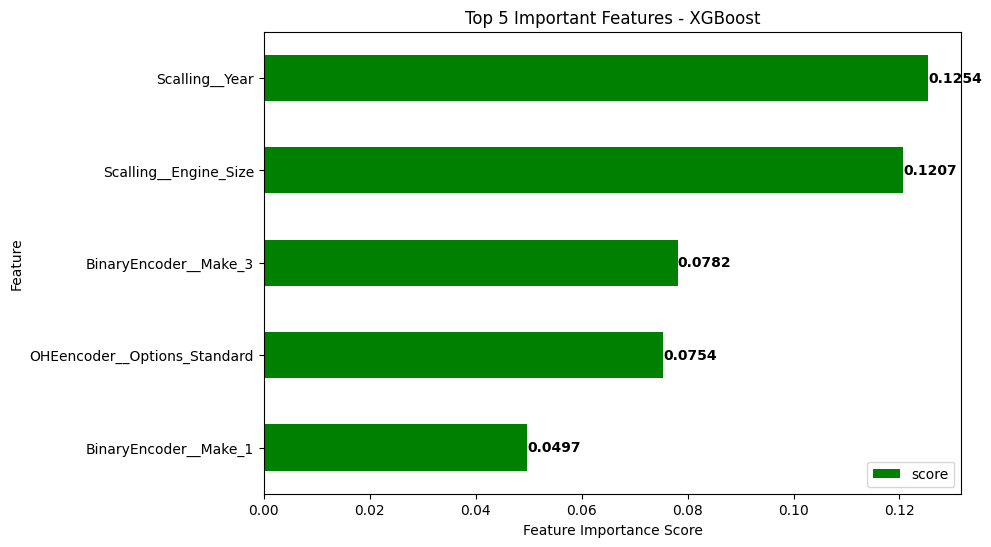

In [67]:

feature_imp = pd.DataFrame()
feature_imp['feature'] = best_xgb.best_estimator_.named_steps['preprocessing'].get_feature_names_out()
feature_imp['score'] = xgb_tuning['model'].feature_importances_
feature_imp = feature_imp.set_index('feature')


top_features = feature_imp.sort_values('score', ascending=True).tail(5)
top_features.plot(kind='barh', figsize=(9, 6), color='green')

# Adding values to the bars
for index, value in enumerate(top_features['score']):
    plt.text(value, index, f'{value:.4f}', ha='left', va='center', color='black', fontweight='bold')

plt.title('Top 5 Important Features - XGBoost')
plt.xlabel('Feature Importance Score')
plt.ylabel('Feature')
plt.show()


If you look at the bar plot and the values ​​above, it can be identified that the `Year`, `Engine_Size` & `Make` features are important features that most influence the `Price` target, and the `Option` feature does not really influence the target.

- Year (`Year`) with an importance value of **0.1254.** This shows that the year of car production is the most important factor in predicting used car prices. Newer cars generally have higher prices than older cars.
- Engine size (`Engine_Size`) with an importance value of **0.1207.** This shows that the size of the car engine is also an important factor in predicting the price of a used car. Cars with larger engines generally have higher prices.
- Brand (`Make`) with an importance value of **0.0782.** This shows that the car brand also has an influence on the price of used cars. Cars from more well-known brands generally have higher prices.
- Options (`Options`) with an importance value of **0.754.** This shows that car option features, such as standard, semi-modified and full modified, also have a significant influence on the price of used cars. Cars with more complete options certainly have higher prices.

 94%|=================== | 2613/2783 [00:12<00:00]       

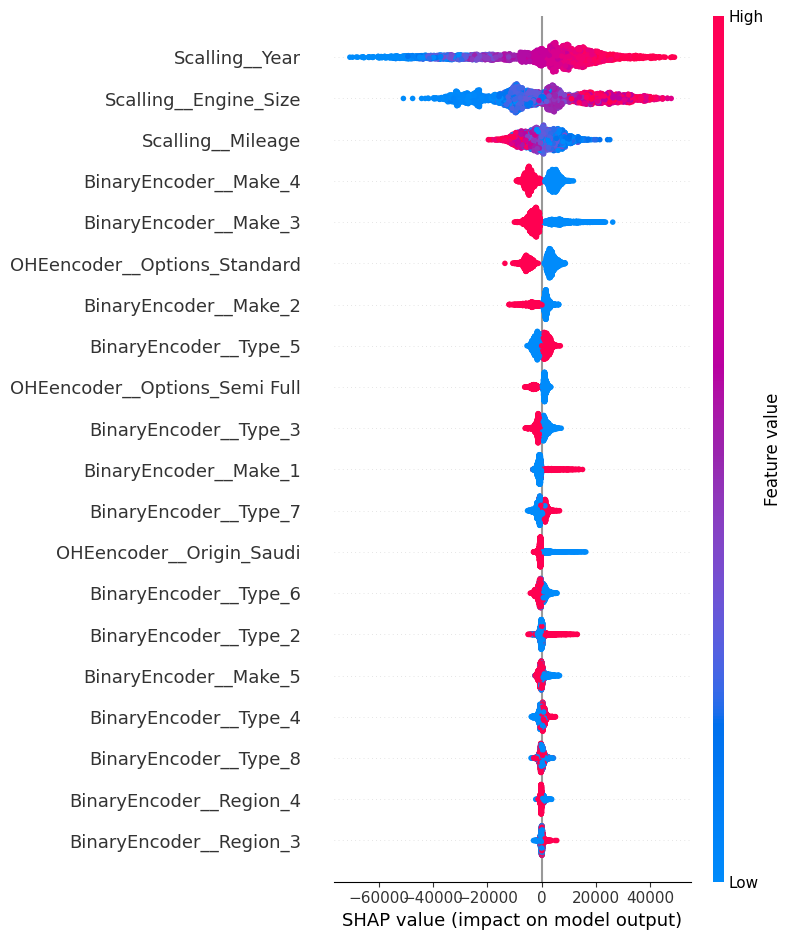

In [68]:
import shap
model_shap = xgb_tuning.named_steps['model']
prep = xgb_tuning.named_steps['preprocessing']
x_test_pre = prep.transform(x_train)
shap_values = shap.TreeExplainer(model_shap,
                                 data = x_test_pre,
                                 model_output="raw").shap_values(x_test_pre)
plt.figure
shap.summary_plot(shap_values, x_test_pre,feature_names = prep.get_feature_names_out())

In more detail, let's see how SHAP can show which features influence price predictions in a machine learning model that we have determined in detail from the distribution of the data. 
From this graph it can be seen that the SHAP (Shapley Value of Explanations) value for year features becomes increasingly positive as the year of car production increases. This means that newer cars have higher prices than older cars. Likewise with engine size, the larger the engine size, the more expensive the price predictions made by the model. for the mileage feature, the less the total mileage on the car, the more it will influence the predicted price to be expensive.

## Conclusion 

- The best model that can be implemented on this data is XGBoost Regressor with hyperparameter tuning in: 
    1. colsample_bytree : 0.8
    2. gamma: 0.01 
    3. learning_rate : 0.1 
    4. max_depth : 7
    5. min_child_weight : 3 
    6. n_estimators : 100 
    7. subsample: 0.8 <br>
<br>

- If we draw a conclusion, this project can use a model to predict the price of used cars with price limitations ranging from 5,000 SAR to 182,000 SAR only, then the number of kilometers between 100,000 Km and 900,000 Km (Limitation).

- If we look at the important features, `Year`, `Engine_Size` & `Make` are important features that influence the target `Price`.

- It can be concluded that if later this model is used to estimate car prices in the value range as trained on the model (with `Price' limitations ranging from 5,000 SAR to 182,000 SAR), then the estimated average price will be off by approximately 15,778. 43 SAR (RMSE) and the average percentage error is around 22.1% (MAPE) from the price that might have been predicted. Even in this model, it does not rule out the possibility that the prediction results are even further off because there is still quite a high bias if we look at the actual and predicted prices. The bias that occurs in this modeling is due to the lack of features that represent variations in car specifications, such as whether this car is a classic or not, whether there is a guarantee or not, whether you have experienced problems with the engine or not and many more.

- Not only that, the limitations in this model certainly have an influence on new testing data which will later be used as a car price prediction model. Because in modeling the data here has been cleaned according to considerations, the model prediction results can be said to be untrustworthy. However, when the data has been adjusted to previous limitations, the prediction results can be trusted regardless of error.

- At the model optimization stage, I also tried to find the best model from XGBoost by providing different scaling processes for the numerical features (feature engineering), and it can be concluded that each scaling has no influence on the score results when viewed from the RMSE.

- To see how the model predicts testing data, whether underprice or overprice can be concluded through the residuals. Data predicted to be **overprice** amounted to **393** data, and data predicted to be **underprice** amounted to **303**. This will certainly answer the goal of making a model to predict the price of used cars, where to make a profit, prices that tend to be overpriced will be good for selling and prices that are underpriced will tend to be good for buying and then reselling by carrying out repairs first.

## Recomendation 

- Regarding the limitations for this modeling, it is best to increase the amount of data to more than 3000 (the amount of data that has been cleaned), so that the model can predict prices more accurately from the large variation in data as well. (Addition of this data needs to be prioritized for data whose representation of variations is relatively small). 

- Added new features that represent variations in car specifications, such as whether this car is a classic type of car, whether there is a guarantee or not, or the condition of the newest car, which has an influence in determining the price of a used car. 

- Using Optuna as Hyperparameter tuning optimization to improve the performance of the selected model, or use other models to minimize the resulting errors.

- Use of another model with a new target to classify whether the car sold is profitable for the company or not. This classification model is useful for companies to cut the costs of servicing cars in very bad condition, or as a consideration whether the car should still be advertised or not (Marketing Analyst).

- By showing which prices are overpriced and underpriced, it would also be better for the company to give special consideration to which prices it feels are reasonable overpriced or underpriced, in this way the company will achieve profits and for customers to find prices that suit their criteria or car specifications.

------

## Save Model 

In [69]:
import pickle
final_model = xgb_tuning.fit(feature,target)
filename = 'Saudi_model_carku.sav'
pickle.dump(final_model, open(filename, 'wb'))

In [70]:
model = pickle.load(open(filename,'rb'))

In [71]:
np.sqrt(mean_squared_error(target,model.predict(feature)))

7105.664990642897